# Train a policy using Imitation Learning part 2: DAgger

In this notebook, we show how to use DAgger to learn to imitate a navigation policy.
We compare training in a single-agent enviroment with training in a multi-agent enviroment and using behavioral cloning instead of DAgger.

For all cases, we use the same configuration as for the `RL` notebook.

In [1]:
import time
import warnings

import gymnasium as gym
import numpy as np
import pandas as pd
import datasets.utils
import tqdm.autonotebook
import imitation.algorithms.bc
from pathlib import Path

from navground import sim
from navground_learning import ControlActionConfig, ObservationConfig
from navground_learning.reward import SocialReward
from navground_learning.env import NavgroundEnv
from navground_learning.env.pz import shared_parallel_env
from navground_learning.il.utils import make_venv

warnings.filterwarnings('ignore')
datasets.utils.tqdm = tqdm.autonotebook.tqdm
imitation.algorithms.bc.tqdm = tqdm.autonotebook
datasets.utils.disable_progress_bar()

log_folder = "logs/IL-Dagger"
save_folder = Path("policies/IL-Dagger")

sensor = sim.load_state_estimation("""
type: Discs
number: 5
range: 5.0
max_speed: 0.12
max_radius: 0
""")

scenario = sim.load_scenario("""
type: Cross
agent_margin: 0.1
side: 4
target_margin: 0.1
tolerance: 0.5
groups:
  -
    type: thymio
    number: 20
    radius: 0.1
    control_period: 0.1
    speed_tolerance: 0.02
    color: gray
    kinematics:
      type: 2WDiff
      wheel_axis: 0.094
      max_speed: 0.12
    behavior:
      type: HL
      optimal_speed: 0.12
      horizon: 5.0
      tau: 0.25
      eta: 0.5
      safety_margin: 0.05
    state_estimation:
      type: Bounded
      range: 5.0
""")

duration = 60.0
time_step = 0.1

action_config = ControlActionConfig(max_acceleration=1.0, max_angular_acceleration=10.0, 
                                    use_acceleration_action=True)

observation_config = ObservationConfig(include_target_distance=True, include_velocity=True, 
                                       include_angular_speed=True, flat=True)

configuration = dict(
    scenario=scenario,
    sensor=sensor,
    action=action_config,
    observation=observation_config,
    reward=SocialReward(),
    time_step=time_step,
    max_duration=duration,
    terminate_outside_bounds=False
)

sa_env = gym.make("navground", **configuration)
ma_env = shared_parallel_env(agent_indices=None, **configuration) # i.e., all agents
sa_venv, _ = make_venv(sa_env) 
ma_venv, _ = make_venv(ma_env) 

In [20]:
from stable_baselines3.common.evaluation import evaluate_policy
from navground_learning.evaluate import evaluate_expert

def evalutate(policy, venv, runs=50):
    reward_mean, reward_std_dev = evaluate_policy(policy, venv, runs)
    total_steps = duration / time_step
    reward_mean /= total_steps
    reward_std_dev /= total_steps
    print(f"Reward: {reward_mean:.3f} ± {reward_std_dev:.3f}")


def evaluate_original(env, runs=50):
    rewards = evaluate_expert(env.unwrapped, runs=runs)
    total_steps = duration / time_step
    number_of_agents = 20
    reward_mean = np.mean(rewards) / total_steps / number_of_agents
    reward_std_dev = np.std(rewards) / total_steps / number_of_agents
    print(f"Reward: {reward_mean:.3f} ± {reward_std_dev:.3f}")

def print_evalutation(trainer, name):
    title = f"1 {name} and 19 HL agents"
    print(title)
    print(len(title) * "=" + "\n")
    evalutate(trainer.policy, sa_venv)
    title = f"20 {name} agents"
    print("")
    print(title)
    print(len(title) * "=" + "\n")
    evalutate(trainer.policy, ma_venv)

In [3]:
print("20 HL agents")
print("============\n")

evaluate_original(sa_env)

20 HL agents

Reward: -0.225 ± 0.014


## Training
### imitation learning with BC

Training with BC does not take advantage of multi-agent enviroments, a part from speeding up the collection of runs.

In [ ]:
bc_kwargs = {'l2_weight': 1e-6, 'ent_weight': 1e-2, 'batch_size': 128}
net_arch = [64, 64]

In [28]:
from navground_learning.il import bc

bc_trainer = bc.Trainer(ma_env, log_formats=['csv', 'tensorboard'], log_directory=f"{log_folder}/bc", 
                        parallel=False, n_envs=8, bc_kwargs=bc_kwargs, net_arch=net_arch)

In [29]:
start = time.time()
bc_trainer.collect_runs(3000)
bc_trainer.train(
    log_rollouts_venv=sa_venv, 
    log_rollouts_n_episodes=10,
    log_interval=100,
    n_epochs=1,
    progress_bar=False
)
print(f'Training took {time.time() - start: .0f} seconds')
bc_trainer.save(save_folder / "BC")

Training took  390 seconds


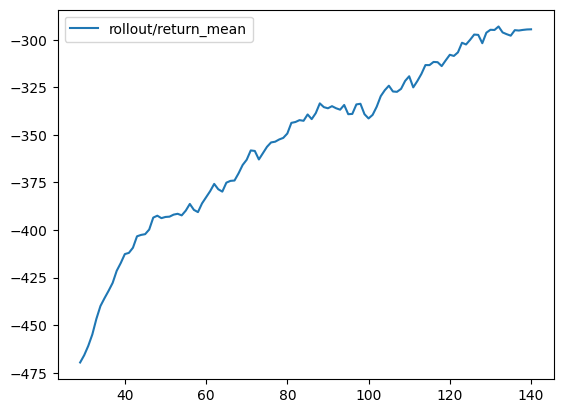

In [49]:
df = pd.read_csv(f'{bc_trainer.logger.get_dir()}/progress.csv')
df.rolling(window=30).mean().plot(y='rollout/return_mean');

In [31]:
print_evalutation(bc_trainer, "BC")

1 BC and 19 HL agents

Reward: -0.494 ± 0.210

20 BC agents

Reward: -0.957 ± 0.226


### imitation learning with DAgger in single-agent environment 

In [32]:
from navground_learning.il import dagger

sa_dagger_trainer = dagger.Trainer(sa_env, log_formats=['csv', 'tensorboard'], log_directory=f"{log_folder}/DAggerSA", 
                                   parallel=False, n_envs=8, bc_kwargs=bc_kwargs, net_arch=net_arch)

In [33]:
start = time.time()
sa_dagger_trainer.train(
    total_timesteps=150_000,
    rollout_round_min_episodes=5,
    bc_train_kwargs={
        'log_rollouts_venv': sa_venv, 
        'log_rollouts_n_episodes': 10,
        'log_interval': 100,
        'n_epochs': 1,
        'progress_bar': False,
    }
)
print(f'Training took {time.time() - start: .0f} seconds')
sa_dagger_trainer.save(save_folder / "DaggerSA")

Training took  519 seconds


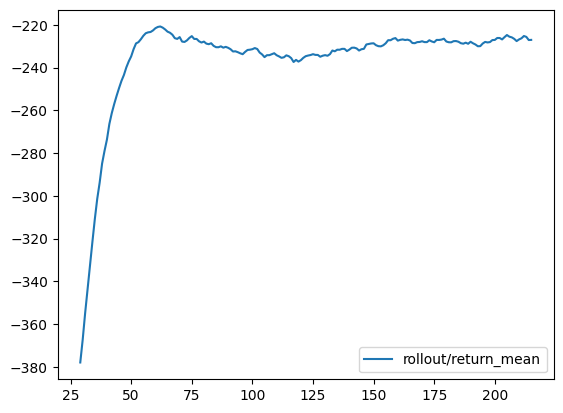

In [48]:
df = pd.read_csv(f'{sa_dagger_trainer.logger.get_dir()}/progress.csv')
df.rolling(window=30).mean().plot(y='rollout/return_mean');

In [50]:
print_evalutation(sa_dagger_trainer, "DAgger [SA]")

1 DAgger [SA] and 19 HL agents

Reward: -0.324 ± 0.069

20 DAgger [SA] agents

Reward: -0.722 ± 0.196


### imitation learning with DAgger in multi-agent environment 

In [12]:
from navground_learning.il import dagger

ma_dagger_trainer = dagger.Trainer(ma_env, log_formats=['tensorboard', 'csv'], log_directory=f"{log_folder}/DAggerMA", 
                                   parallel=False, n_envs=1, bc_kwargs=bc_kwargs, net_arch=net_arch)

In [13]:
start = time.time()
ma_dagger_trainer.train(
    total_timesteps=500_000,
    rollout_round_min_episodes=20,
    bc_train_kwargs={
        'log_rollouts_venv': ma_venv, 
        'log_rollouts_n_episodes': 10,
        'log_interval': 100,
        'n_epochs': 1,
        'progress_bar': False,
    }
)
print(f'Training took {time.time() - start: .0f} seconds')
ma_dagger_trainer.save(save_folder / "DaggerMA")

Training took  855 seconds


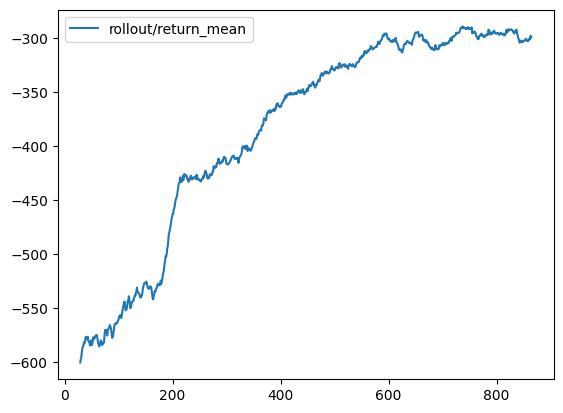

In [46]:
df = pd.read_csv(f'{ma_dagger_trainer.logger.get_dir()}/progress.csv')
df.rolling(window=30).mean().plot(y='rollout/return_mean');

In [51]:
print_evalutation(ma_dagger_trainer, "DAgger [MA]")

1 DAgger [MA] and 19 HL agents

Reward: -0.350 ± 0.047

20 DAgger [MA] agents

Reward: -0.418 ± 0.070


## Analysis

In [52]:
from matplotlib import pyplot as plt
from navground.sim.ui.video import display_video_from_run, record_video_from_run
from navground_learning.evaluate import make_experiment_with_env
from navground_learning.config import get_elements_at, to_list

def display_run(policy=None, indices=None, seed=0, steps=600, color='red', display_width=360, save='', **kwargs):
    if policy:
        policies=[(indices, policy)]
    else:
        policies = []
    experiment = make_experiment_with_env(ma_env.unwrapped, policies=policies)
    experiment.number_of_runs = 1
    experiment.record_config.pose = True
    experiment.run_index = seed
    experiment.steps = steps
    experiment.run()
    for agent in get_elements_at(indices, experiment.runs[seed].world.agents):
        agent.color = color
    if save:
        record_video_from_run(save, experiment.runs[seed], **kwargs)
    return display_video_from_run(experiment.runs[seed], display_width=display_width, **kwargs)

def plot_reward(policy=None, indices=None, number=1, steps=600, color='red'):
    if policy:
        policies=[(indices, policy)]
    else:
        policies = []
    experiment = make_experiment_with_env(ma_env.unwrapped, policies=policies)
    experiment.number_of_runs = number
    experiment.steps = steps
    experiment.run()
    rewards = np.asarray([run.get_record("reward") for run in experiment.runs.values()])
    agents = experiment.runs[0].world.agents
    policy_indices = to_list(indices, agents) 
    original_indices = [i for i in range(len(agents)) if i not in policy_indices]
    if original_indices:
        rs = rewards[..., original_indices].flatten()
        plt.hist(rs, density=True, color='black', alpha=0.5, bins=30,
                 label=f"Agent with original behavior");
        print(f'Original behavior mean reward: {np.mean(rs):.3f} ± {np.std(rs):.3f}')
    if policy_indices:
        rs = rewards[..., policy_indices].flatten()
        plt.hist(rs, density=True, color=color, alpha=0.5, bins=30, 
                 label=f"Agents with policy")
        print(f'ML Policy mean reward: {np.mean(rs):.3f} ± {np.std(rs):.3f}')
    plt.title(f'Reward distribution')
    ax = plt.gca()
    ax.set_yticks([])
    ax.yaxis.set_tick_params(labelleft=False)
    plt.xlabel("reward")
    plt.ylabel("probability")
    plt.legend()

In [53]:
display_run(ma_dagger_trainer.policy, factor=10, steps=1800, save=f"{log_folder}/dagger_ma.mp4", color='green')

ML Policy mean reward: -0.477 ± 0.308


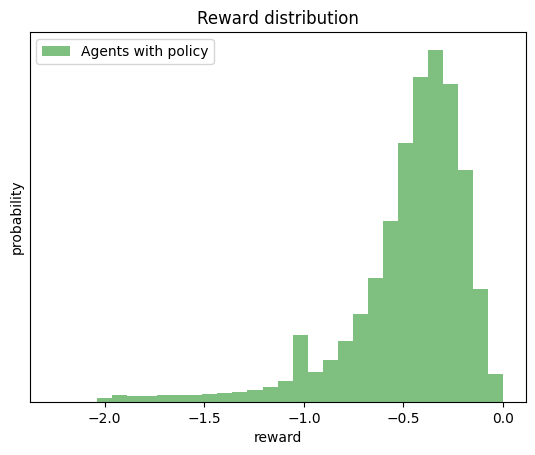

In [54]:
plot_reward(ma_dagger_trainer.policy, number=20, color='green')

In [55]:
display_run(sa_dagger_trainer.policy, factor=10, steps=1800, save=f"{log_folder}/dagger_sa.mp4", color='cyan')

ML Policy mean reward: -0.779 ± 0.645


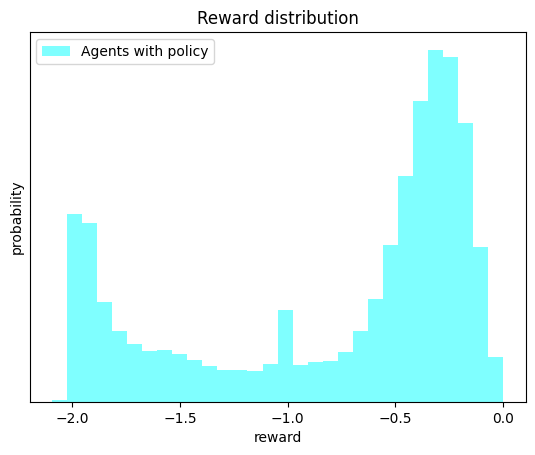

In [56]:
plot_reward(sa_dagger_trainer.policy, number=20, color='cyan')

In [57]:
display_run(bc_trainer.policy, factor=10, steps=1800, save=f"{log_folder}/bc.mp4", color='blue')

ML Policy mean reward: -0.916 ± 0.661


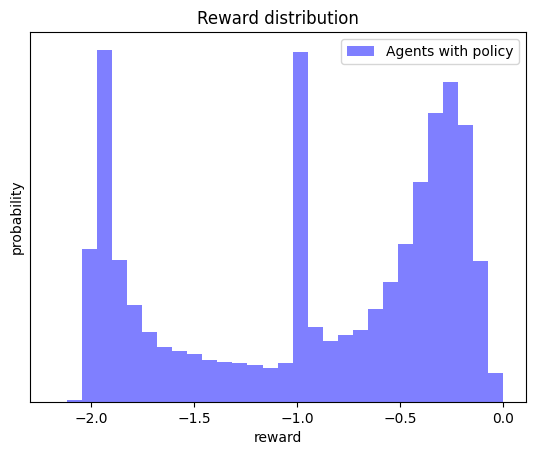

In [58]:
plot_reward(bc_trainer.policy, number=20,  color='blue')

In [65]:
def display_mixed(steps=600, seed=123, display_width=360, save='', **kwargs):

    policies = [(slice(0, 5), None), 
                (slice(5, 10), bc_trainer.policy), 
                (slice(10, 15), sa_dagger_trainer.policy),
                (slice(15, 20), ma_dagger_trainer.policy)]
    
    experiment = make_experiment_with_env(ma_env.unwrapped, policies=policies)
    experiment.number_of_runs = 1
    experiment.record_config.pose = True
    experiment.run_index = seed
    experiment.steps = steps
    experiment.run()
    colors = 'grey', 'blue', 'cyan', 'green'
    for color, (indices, _) in zip(colors, policies):
        for agent in experiment.runs[seed].world.agents[indices]:
            agent.color = color
    if save:
        record_video_from_run(save, experiment.runs[seed], **kwargs)
    return display_video_from_run(experiment.runs[seed], display_width=display_width, **kwargs)

In [66]:
display_mixed(factor=10, steps=2400, save=f"{log_folder}/mixed.mp4")